# Reading in and processing the satellite data

In [195]:
! pip install /Users/ariane/Documents/code/remseno/dist/remseno-0.0.1.tar.gz

#https://www.envidat.ch/#/metadata/pfynwald

Processing /Users/ariane/Documents/code/remseno/dist/remseno-0.0.1.tar.gz
  Preparing metadata (setup.py) ... done


  Created wheel for remseno: filename=remseno-0.0.1-py3-none-any.whl size=55387 sha256=90ab52bade746bbe4d83f8433685a07c9f76be1e1a57a9998a3ec9dd4a631201
  Stored in directory: /Users/ariane/Library/Caches/pip/wheels/d6/dc/60/90822bf7a588c586397c0d67b4da6cb9f75f949c74ed65b439
Successfully built remseno
  Attempting uninstall: remseno
    Found existing installation: remseno 0.0.1
    Uninstalling remseno-0.0.1:
      Successfully uninstalled remseno-0.0.1


In [1]:
# First we need to map between the satellite and the files

import pandas as pd
import os

data_dir = '../data/tallo/planetscope/'
df = pd.read_csv(f'{data_dir}download_DF_dedup.csv')
sat_files = os.listdir(f'{data_dir}sat_data/')
df

,Unnamed: 0,latitude,longitude,tree_id,division,family,genus,species,stem_diameter_cm,height_m,crown_radius_m,binary_label,x0,x1,y0,y1,polygon_90m,image_ids
0,0,-43.2561,146.9190,T_498824,Angiosperm,Myrtaceae,Eucalyptus,Eucalyptus globulus,554.000000,82.300000,NaN,0,-43.256662,-43.255538,146.918595,146.919405,"[(146.9185945945946, -43.2555375), (146.918594...",20230113_230929_43_241e
1,1,-42.9662,146.7574,T_498779,Angiosperm,Myrtaceae,Eucalyptus,Eucalyptus globulus,388.000000,85.100000,NaN,0,-42.966763,-42.965637,146.756995,146.757805,"[(146.75699459459457, -42.9656375), (146.75699...",20230113_230924_81_241e
2,4,-42.8000,147.6000,T_332054,Angiosperm,Myrtaceae,Eucalyptus,Eucalyptus globulus,20.933333,20.500000,NaN,0,-42.800562,-42.799438,147.599595,147.600405,"[(147.59959459459458, -42.799437499999996), (1...",20221226_230459_63_2465
3,6,-38.4000,145.9000,T_332135,Angiosperm,Myrtaceae,Eucalyptus,Eucalyptus globulus,24.450000,20.033333,NaN,0,-38.400562,-38.399437,145.899595,145.900405,"[(145.8995945945946, -38.3994375), (145.899594...",20221218_231416_10_2451
4,7,-37.8000,147.8000,T_332533,Angiosperm,Myrtaceae,Eucalyptus,Eucalyptus globulus,30.212500,11.062500,NaN,0,-37.800562,-37.799438,147.799595,147.800405,"[(147.7995945945946, -37.799437499999996), (14...",20221224_230916_56_241f
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266,52736,62.5000,29.2000,T_126621,Gymnosperm,Pinaceae,Pinus,Pinus sylvestris,19.291852,17.693926,2.206399,1,62.499437,62.500563,29.199595,29.200405,"[(29.199594594594593, 62.5005625), (29.1995945...",20220629_082513_12_2427
267,52737,63.5000,41.8400,T_496109,Gymnosperm,Pinaceae,Pinus,Pinus sylvestris,5.368750,6.912500,0.653125,1,63.499437,63.500563,41.839595,41.840405,"[(41.8395945945946, 63.5005625), (41.839594594...",20220712_073718_73_2464
268,52738,65.2200,33.1700,T_344679,Gymnosperm,Pinaceae,Pinus,Pinus sylvestris,28.000000,16.590909,NaN,1,65.219437,65.220562,33.169595,33.170405,"[(33.1695945945946, 65.2205625), (33.169594594...",20230514_081024_50_2451
269,52739,67.3950,28.7230,T_11,Gymnosperm,Pinaceae,Pinus,Pinus sylvestris,30.575536,16.269957,2.020601,1,67.394437,67.395562,28.722595,28.723405,"[(28.722594594594593, 67.3955625), (28.7225945...",20230619_083808_03_2423


In [2]:
img_id_to_paths = {}
for f in sat_files:
    try:
        for s in os.listdir(f'{data_dir}sat_data/{f}/PSScene/'):
            if '.tif' in s and '_3B_AnalyticMS_SR_8b_clip.tif' in s: #'20221218_230845_90_2459_3B_AnalyticMS_SR_8b_clip.tif'
                img_id = s.replace('_3B_AnalyticMS_SR_8b_clip.tif', '')
                img_id_to_paths[img_id] = f'{data_dir}sat_data/{f}/PSScene/{s}'
    except:
        print(f)

.DS_Store
PSScene
manifest.json
4e2e792b-7180-48df-96db-f8223e028d94


In [3]:
# Now add to the df
paths = []
for img_id in df['image_ids'].values:
    paths.append(img_id_to_paths.get(img_id))
df['path'] = paths
df

,Unnamed: 0,latitude,longitude,tree_id,division,family,genus,species,stem_diameter_cm,height_m,crown_radius_m,binary_label,x0,x1,y0,y1,polygon_90m,image_ids,path
0,0,-43.2561,146.9190,T_498824,Angiosperm,Myrtaceae,Eucalyptus,Eucalyptus globulus,554.000000,82.300000,NaN,0,-43.256662,-43.255538,146.918595,146.919405,"[(146.9185945945946, -43.2555375), (146.918594...",20230113_230929_43_241e,None
1,1,-42.9662,146.7574,T_498779,Angiosperm,Myrtaceae,Eucalyptus,Eucalyptus globulus,388.000000,85.100000,NaN,0,-42.966763,-42.965637,146.756995,146.757805,"[(146.75699459459457, -42.9656375), (146.75699...",20230113_230924_81_241e,../data/tallo/planetscope/sat_data/e4f78ad4-f3...
2,4,-42.8000,147.6000,T_332054,Angiosperm,Myrtaceae,Eucalyptus,Eucalyptus globulus,20.933333,20.500000,NaN,0,-42.800562,-42.799438,147.599595,147.600405,"[(147.59959459459458, -42.799437499999996), (1...",20221226_230459_63_2465,../data/tallo/planetscope/sat_data/7ff0b6f0-ac...
3,6,-38.4000,145.9000,T_332135,Angiosperm,Myrtaceae,Eucalyptus,Eucalyptus globulus,24.450000,20.033333,NaN,0,-38.400562,-38.399437,145.899595,145.900405,"[(145.8995945945946, -38.3994375), (145.899594...",20221218_231416_10_2451,../data/tallo/planetscope/sat_data/3fdb955c-08...
4,7,-37.8000,147.8000,T_332533,Angiosperm,Myrtaceae,Eucalyptus,Eucalyptus globulus,30.212500,11.062500,NaN,0,-37.800562,-37.799438,147.799595,147.800405,"[(147.7995945945946, -37.799437499999996), (14...",20221224_230916_56_241f,../data/tallo/planetscope/sat_data/3cfdee76-41...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266,52736,62.5000,29.2000,T_126621,Gymnosperm,Pinaceae,Pinus,Pinus sylvestris,19.291852,17.693926,2.206399,1,62.499437,62.500563,29.199595,29.200405,"[(29.199594594594593, 62.5005625), (29.1995945...",20220629_082513_12_2427,../data/tallo/planetscope/sat_data/61ca3517-43...
267,52737,63.5000,41.8400,T_496109,Gymnosperm,Pinaceae,Pinus,Pinus sylvestris,5.368750,6.912500,0.653125,1,63.499437,63.500563,41.839595,41.840405,"[(41.8395945945946, 63.5005625), (41.839594594...",20220712_073718_73_2464,../data/tallo/planetscope/sat_data/fa54a299-0e...
268,52738,65.2200,33.1700,T_344679,Gymnosperm,Pinaceae,Pinus,Pinus sylvestris,28.000000,16.590909,NaN,1,65.219437,65.220562,33.169595,33.170405,"[(33.1695945945946, 65.2205625), (33.169594594...",20230514_081024_50_2451,../data/tallo/planetscope/sat_data/a02b7f50-9e...
269,52739,67.3950,28.7230,T_11,Gymnosperm,Pinaceae,Pinus,Pinus sylvestris,30.575536,16.269957,2.020601,1,67.394437,67.395562,28.722595,28.723405,"[(28.722594594594593, 67.3955625), (28.7225945...",20230619_083808_03_2423,../data/tallo/planetscope/sat_data/e736ecff-9f...


In [6]:
df[df['image_ids'] == '20230113_230924_81_241e'].to_csv(f'{data_dir}planetscope_path.csv', index=False)

In [176]:
df.head(5).to_csv(f'{data_dir}planetscope_test.csv', index=False)

--------------------------------------------------------------------------------
left edge coord:	347793.0	
bottom edge coord:	4675698.0	
right edge coord:	348324.0	
top edge coord:	4676211.0	
dataset width:	177	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 347793.00|
| 0.00,-3.00, 4676211.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	341751.0	
bottom edge coord:	4718715.0	
right edge coord:	342279.0	
top edge coord:	4719231.0	
dataset width:	176	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 341751.00|
| 0.00,-3.00, 4719231.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

--------------------------------------------------------------------------------
left edge coord:	257790.0	
bottom edge coord:	4292787.0	
right edge coord:	258354.0	
top edge coord:	4293309.0	
dataset width:	188	
dataset height:	174	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 257790.00|
| 0.00,-3.00, 4293309.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	347736.0	
bottom edge coord:	4303773.0	
right edge coord:	348291.0	
top edge coord:	4304289.0	
dataset width:	185	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 347736.00|
| 0.00,-3.00, 4304289.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

--------------------------------------------------------------------------------
left edge coord:	660090.0	
bottom edge coord:	4873560.0	
right edge coord:	660609.0	
top edge coord:	4874076.0	
dataset width:	173	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32632	
data transform
	| 3.00, 0.00, 660090.00|
| 0.00,-3.00, 4874076.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	299988.0	
bottom edge coord:	4899756.0	
right edge coord:	300504.0	
top edge coord:	4900275.0	
dataset width:	172	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32634	
data transform
	| 3.00, 0.00, 299988.00|
| 0.00,-3.00, 4900275.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------


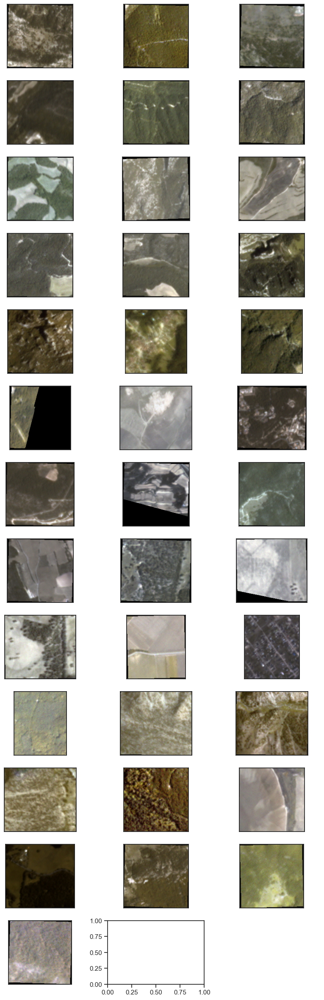

In [8]:
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
plt.rcParams['svg.fonttype'] = 'none'
from remseno import *
fig_dir = f'{data_dir}fig/'
n = 3
fig, axs = plt.subplots(len(set(df['species'].values))-1, n, figsize=(10, 30), facecolor='w', edgecolor='w')

axs = axs.ravel()
axi = 0
for species in set(df['species'].values):
    sub_df = df[df['species'] == species]
    ni = 0
    for img_path in sub_df['path'].values:
        if ni >= n:
            break
        if img_path != None:
            o = Image()
            o.load_image(image_path=img_path)
            o.name = species
            ax = o.plot_rbg(axs[axi])
            ax.set_yticks([])
            ax.set_xticks([])
            axi += 1
            ni += 1
plt.axis('off')
plt.gca().axes.get_yaxis().set_visible(False)
plt.gca().axes.get_xaxis().set_visible(False)

plt.savefig(f'{fig_dir}planetscope_data_overview.svg')
plt.show()


# Plot NDVI filter/mask for each of these

--------------------------------------------------------------------------------
left edge coord:	347793.0	
bottom edge coord:	4675698.0	
right edge coord:	348324.0	
top edge coord:	4676211.0	
dataset width:	177	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 347793.00|
| 0.00,-3.00, 4676211.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	341751.0	
bottom edge coord:	4718715.0	
right edge coord:	342279.0	
top edge coord:	4719231.0	
dataset width:	176	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 341751.00|
| 0.00,-3.00, 4719231.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

/Users/ariane/opt/miniconda3/envs/rhm/lib/python3.10/site-packages/remseno/indices.py:83: RuntimeWarning: invalid value encountered in divide
  ndvi = (nir - red_band) / (nir + red_band)


--------------------------------------------------------------------------------
left edge coord:	421731.0	
bottom edge coord:	5957877.0	
right edge coord:	422298.0	
top edge coord:	5958384.0	
dataset width:	189	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 421731.00|
| 0.00,-3.00, 5958384.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	629739.0	
bottom edge coord:	5406477.0	
right edge coord:	630213.0	
top edge coord:	5406990.0	
dataset width:	158	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 629739.00|
| 0.00,-3.00, 5406990.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

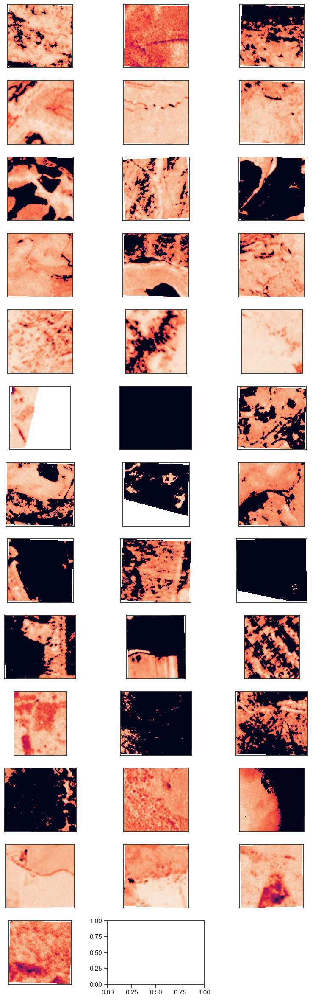

In [9]:
import matplotlib.pyplot as plt
from remseno import *
fig_dir = f'{data_dir}fig/'
n = 3

fig, axs = plt.subplots(len(set(df['species'].values))-1, n, figsize=(10, 30), facecolor='w', edgecolor='w')

axs = axs.ravel()
axi = 0
for species in set(df['species'].values):
    sub_df = df[df['species'] == species]
    ni = 0
    for img_path in sub_df['path'].values:
        if ni >= n:
            break
        if img_path != None:
            o = Image()
            o.load_image(image_path=img_path)
            o.name = species
            ndvi = get_ndvi(image=o.image, red_band=6, nir_band=8)
            mask = o.mask_on_index(ndvi, 0.5)
            axs[axi].imshow(mask*ndvi)
            axs[axi].set_yticks([])
            axs[axi].set_xticks([])
            axi += 1
            ni += 1
plt.axis('off')
plt.gca().axes.get_yaxis().set_visible(False)
plt.gca().axes.get_xaxis().set_visible(False)
plt.savefig(f'{fig_dir}Figure2_planetscope_NDVI_mask.svg')
plt.show()


# have a look at the manually annotated trees

In [10]:
df = pd.read_csv(f'{data_dir}manual/download_DF_dedup_manual_trees.txt', sep='\t')
df = df.dropna(subset=['data_5'])
df['path'] = [img_id_to_paths.get(image_id) for image_id in df['image_ids'].values]

In [11]:
# Save the coords as a df for each of the rows
t_ids = df['tree_id'].values
data_rows = df[['data_1', 'data_2', 'data_3', 'data_4', 'data_5']].values
for i, s in enumerate(df['species'].values):
    ids, lats, lons, species = [], [], [], []
    for d in data_rows[i]:
        lat_lon = d.strip().split(',')
        lats.append(float(lat_lon[0]))
        lons.append(float(lat_lon[1]))
        ids.append(t_ids[i])
        species.append(s)
    t_df = pd.DataFrame()
    t_df['id'] = ids
    t_df['lat'] = lats
    t_df['lon'] = lons
    t_df['species'] = species
    t_df.to_csv(f'{data_dir}coords/{t_ids[i]}.csv', index=False)

In [12]:
t_df

,id,lat,lon,species
0,T_342238,55.329699,37.000413,Quercus robur
1,T_342238,55.330853,37.000089,Quercus robur
2,T_342238,55.331243,37.000938,Quercus robur
3,T_342238,55.330706,37.001542,Quercus robur
4,T_342238,55.329823,36.997854,Quercus robur


--------------------------------------------------------------------------------
left edge coord:	483501.0	
bottom edge coord:	5096040.0	
right edge coord:	483990.0	
top edge coord:	5096544.0	
dataset width:	163	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32632	
data transform
	| 3.00, 0.00, 483501.00|
| 0.00,-3.00, 5096544.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_496860 ../data/tallo/planetscope/sat_data/205329a8-65d5-493a-b55f-1b905b217aaa/PSScene/20220715_092201_89_2430_3B_AnalyticMS_SR_8b_clip.tif Castanea sativa
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


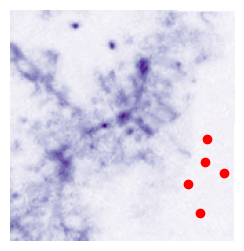

--------------------------------------------------------------------------------
left edge coord:	491253.0	
bottom edge coord:	5103801.0	
right edge coord:	491739.0	
top edge coord:	5104305.0	
dataset width:	162	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32632	
data transform
	| 3.00, 0.00, 491253.00|
| 0.00,-3.00, 5104305.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_497005 ../data/tallo/planetscope/sat_data/97ad3efd-0200-4313-917f-7b1c65243d93/PSScene/20220731_091842_58_2464_3B_AnalyticMS_SR_8b_clip.tif Castanea sativa
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


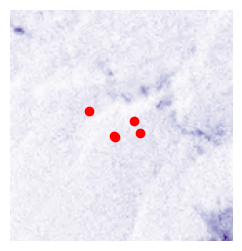

--------------------------------------------------------------------------------
left edge coord:	334416.0	
bottom edge coord:	5138256.0	
right edge coord:	334914.0	
top edge coord:	5138775.0	
dataset width:	166	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32632	
data transform
	| 3.00, 0.00, 334416.00|
| 0.00,-3.00, 5138775.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_496903 ../data/tallo/planetscope/sat_data/7887de72-9abc-4471-95ee-29c7ad7ab3ed/PSScene/20220717_093452_75_2235_3B_AnalyticMS_SR_8b_clip.tif Castanea sativa
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


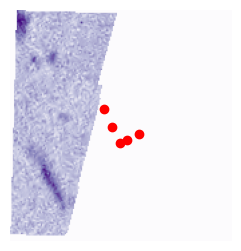

--------------------------------------------------------------------------------
left edge coord:	627357.0	
bottom edge coord:	6217872.0	
right edge coord:	627945.0	
top edge coord:	6218382.0	
dataset width:	196	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 627357.00|
| 0.00,-3.00, 6218382.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_390917 ../data/tallo/planetscope/sat_data/56ab7622-ea90-46cc-8858-630fd28d432b/PSScene/20221218_230804_14_2459_3B_AnalyticMS_SR_8b_clip.tif Eucalyptus camaldulensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


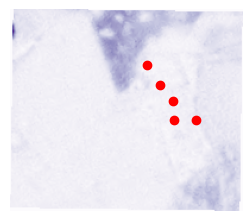

--------------------------------------------------------------------------------
left edge coord:	639990.0	
bottom edge coord:	6358545.0	
right edge coord:	640587.0	
top edge coord:	6359058.0	
dataset width:	199	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 639990.00|
| 0.00,-3.00, 6359058.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_327763 ../data/tallo/planetscope/sat_data/af03ac5c-67de-4c74-aa2f-04744d09110c/PSScene/20221225_231035_90_2464_3B_AnalyticMS_SR_8b_clip.tif Eucalyptus camaldulensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


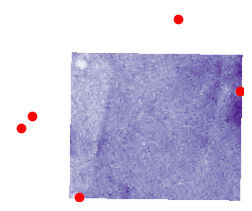

--------------------------------------------------------------------------------
left edge coord:	566106.0	
bottom edge coord:	6503433.0	
right edge coord:	566703.0	
top edge coord:	6503940.0	
dataset width:	199	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32750	
data transform
	| 3.00, 0.00, 566106.00|
| 0.00,-3.00, 6503940.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_330648 ../data/tallo/planetscope/sat_data/69f52d46-951a-4b99-991a-a8c862eef0c1/PSScene/20221230_011616_53_2465_3B_AnalyticMS_SR_8b_clip.tif Eucalyptus camaldulensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


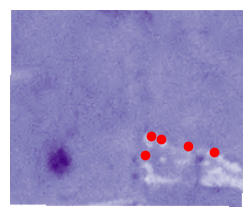

--------------------------------------------------------------------------------
left edge coord:	479958.0	
bottom edge coord:	5242659.0	
right edge coord:	480471.0	
top edge coord:	5243163.0	
dataset width:	171	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 479958.00|
| 0.00,-3.00, 5243163.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_498779 ../data/tallo/planetscope/sat_data/e4f78ad4-f367-4211-844d-dc75b0bdbd84/PSScene/20230113_230924_81_241e_3B_AnalyticMS_SR_8b_clip.tif Eucalyptus globulus
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


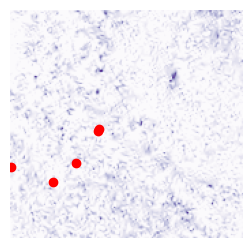

--------------------------------------------------------------------------------
left edge coord:	548805.0	
bottom edge coord:	5260968.0	
right edge coord:	549321.0	
top edge coord:	5261472.0	
dataset width:	172	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 548805.00|
| 0.00,-3.00, 5261472.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_332054 ../data/tallo/planetscope/sat_data/7ff0b6f0-ac10-4441-9f31-5eaff752f8c7/PSScene/20221226_230459_63_2465_3B_AnalyticMS_SR_8b_clip.tif Eucalyptus globulus
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


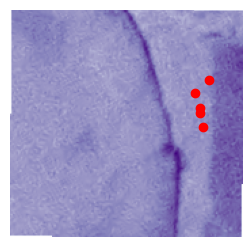

--------------------------------------------------------------------------------
left edge coord:	425742.0	
bottom edge coord:	5858121.0	
right edge coord:	426174.0	
top edge coord:	5858631.0	
dataset width:	144	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 425742.00|
| 0.00,-3.00, 5858631.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_385596 ../data/tallo/planetscope/sat_data/112da36e-77ea-4bc4-ba68-d47cb1496f1f/PSScene/20220627_090602_59_2455_3B_AnalyticMS_SR_8b_clip.tif Fagus sylvatica
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


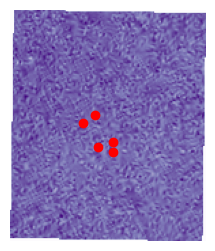

--------------------------------------------------------------------------------
left edge coord:	589614.0	
bottom edge coord:	6104343.0	
right edge coord:	590028.0	
top edge coord:	6104853.0	
dataset width:	138	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32634	
data transform
	| 3.00, 0.00, 589614.00|
| 0.00,-3.00, 6104853.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_116468 ../data/tallo/planetscope/sat_data/e9954051-7d61-41b5-915d-a2e55fd10f05/PSScene/20220722_083509_20_2428_3B_AnalyticMS_SR_8b_clip.tif Fagus sylvatica
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


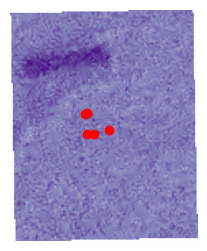

--------------------------------------------------------------------------------
left edge coord:	449280.0	
bottom edge coord:	6173730.0	
right edge coord:	449682.0	
top edge coord:	6174240.0	
dataset width:	134	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 449280.00|
| 0.00,-3.00, 6174240.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_114569 ../data/tallo/planetscope/sat_data/8cc1cb2e-dd54-44c1-8621-0b3068d653e9/PSScene/20230514_090811_35_2449_3B_AnalyticMS_SR_8b_clip.tif Fagus sylvatica
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


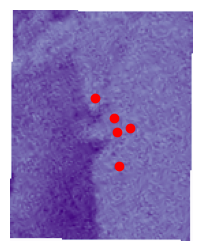

--------------------------------------------------------------------------------
left edge coord:	606780.0	
bottom edge coord:	4427700.0	
right edge coord:	607323.0	
top edge coord:	4428210.0	
dataset width:	181	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 606780.00|
| 0.00,-3.00, 4428210.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_271641 ../data/tallo/planetscope/sat_data/ac309268-208c-46bd-8eda-749131854abf/PSScene/20220621_093201_88_2435_3B_AnalyticMS_SR_8b_clip.tif Pinus halepensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


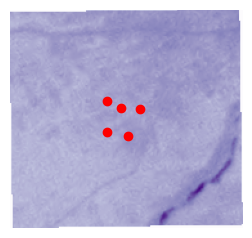

--------------------------------------------------------------------------------
left edge coord:	321762.0	
bottom edge coord:	4581759.0	
right edge coord:	322299.0	
top edge coord:	4582275.0	
dataset width:	179	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 321762.00|
| 0.00,-3.00, 4582275.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_229086 ../data/tallo/planetscope/sat_data/ea05bbfc-4079-4651-bad1-17d30326cef7/PSScene/20220713_094524_71_2460_3B_AnalyticMS_SR_8b_clip.tif Pinus halepensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


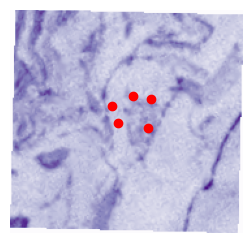

--------------------------------------------------------------------------------
left edge coord:	343728.0	
bottom edge coord:	4644792.0	
right edge coord:	344259.0	
top edge coord:	4645308.0	
dataset width:	177	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 343728.00|
| 0.00,-3.00, 4645308.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_246928 ../data/tallo/planetscope/sat_data/0e9a833a-7dc4-4a35-a03b-2cca65004d70/PSScene/20220713_094515_54_2460_3B_AnalyticMS_SR_8b_clip.tif Pinus halepensis
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


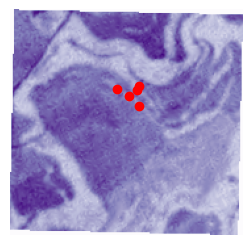

--------------------------------------------------------------------------------
left edge coord:	357780.0	
bottom edge coord:	4646718.0	
right edge coord:	358311.0	
top edge coord:	4647234.0	
dataset width:	177	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 357780.00|
| 0.00,-3.00, 4647234.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_248769 ../data/tallo/planetscope/sat_data/c0ecd39d-b121-4237-93e3-4c5d604e9e52/PSScene/20220615_094548_18_2428_3B_AnalyticMS_SR_8b_clip.tif Pinus nigra
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


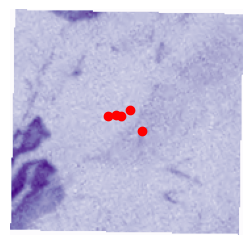

--------------------------------------------------------------------------------
left edge coord:	760440.0	
bottom edge coord:	4672659.0	
right edge coord:	760977.0	
top edge coord:	4673181.0	
dataset width:	179	
dataset height:	174	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32630	
data transform
	| 3.00, 0.00, 760440.00|
| 0.00,-3.00, 4673181.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_229579 ../data/tallo/planetscope/sat_data/2b8adeca-ee79-4ffd-ba0a-fdefc2c02e90/PSScene/20220726_094935_19_2463_3B_AnalyticMS_SR_8b_clip.tif Pinus nigra
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


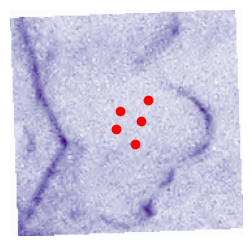

--------------------------------------------------------------------------------
left edge coord:	469008.0	
bottom edge coord:	5138316.0	
right edge coord:	469494.0	
top edge coord:	5138823.0	
dataset width:	162	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32636	
data transform
	| 3.00, 0.00, 469008.00|
| 0.00,-3.00, 5138823.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_342146 ../data/tallo/planetscope/sat_data/f1d22bfa-873b-4e43-9a4b-e885cbfb94e7/PSScene/20220619_074626_82_2430_3B_AnalyticMS_SR_8b_clip.tif Pinus nigra
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


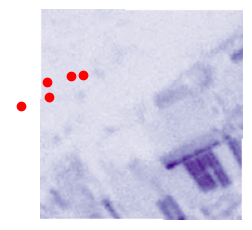

--------------------------------------------------------------------------------
left edge coord:	406755.0	
bottom edge coord:	4626699.0	
right edge coord:	407286.0	
top edge coord:	4627209.0	
dataset width:	177	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 406755.00|
| 0.00,-3.00, 4627209.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_251805 ../data/tallo/planetscope/sat_data/8463c192-e4f8-4632-8a55-e46a44adc5d9/PSScene/20220803_094107_38_2451_3B_AnalyticMS_SR_8b_clip.tif Pinus pinea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


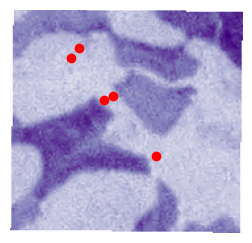

--------------------------------------------------------------------------------
left edge coord:	690474.0	
bottom edge coord:	5539317.0	
right edge coord:	690945.0	
top edge coord:	5539836.0	
dataset width:	157	
dataset height:	173	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32634	
data transform
	| 3.00, 0.00, 690474.00|
| 0.00,-3.00, 5539836.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_119451 ../data/tallo/planetscope/sat_data/b5165857-908a-4637-a99e-c1cdfac1a34d/PSScene/20230506_082424_05_2430_3B_AnalyticMS_SR_8b_clip.tif Pinus sylvestris
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


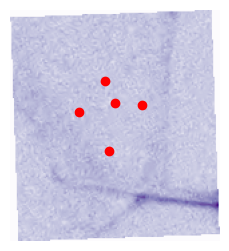

--------------------------------------------------------------------------------
left edge coord:	406032.0	
bottom edge coord:	5770341.0	
right edge coord:	406473.0	
top edge coord:	5770854.0	
dataset width:	147	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 406032.00|
| 0.00,-3.00, 5770854.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_113959 ../data/tallo/planetscope/sat_data/a0ee8aec-7b8a-4b59-a785-65be076c9c9d/PSScene/20220627_090613_94_2455_3B_AnalyticMS_SR_8b_clip.tif Pinus sylvestris
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


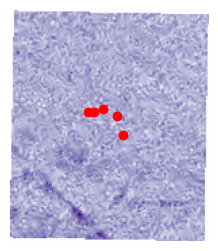

--------------------------------------------------------------------------------
left edge coord:	405045.0	
bottom edge coord:	6151200.0	
right edge coord:	405453.0	
top edge coord:	6151713.0	
dataset width:	136	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32643	
data transform
	| 3.00, 0.00, 405045.00|
| 0.00,-3.00, 6151713.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_343226 ../data/tallo/planetscope/sat_data/3c362d70-b916-450a-967f-02212d8f74c9/PSScene/20230611_051422_39_241f_3B_AnalyticMS_SR_8b_clip.tif Pinus sylvestris
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


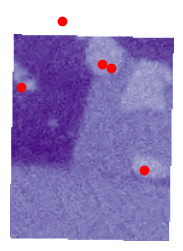

--------------------------------------------------------------------------------
left edge coord:	400761.0	
bottom edge coord:	4613787.0	
right edge coord:	401289.0	
top edge coord:	4614297.0	
dataset width:	176	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 400761.00|
| 0.00,-3.00, 4614297.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_240435 ../data/tallo/planetscope/sat_data/c08159e0-bf34-4ba5-a305-d090b57f3cfc/PSScene/20220611_094231_01_2463_3B_AnalyticMS_SR_8b_clip.tif Quercus faginea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


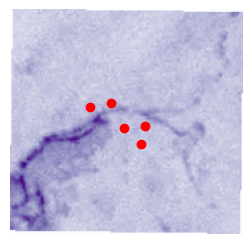

--------------------------------------------------------------------------------
left edge coord:	333759.0	
bottom edge coord:	4689792.0	
right edge coord:	334290.0	
top edge coord:	4690305.0	
dataset width:	177	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 333759.00|
| 0.00,-3.00, 4690305.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_213843 ../data/tallo/planetscope/sat_data/7681af08-2ba8-4fbd-87df-a57631ff8c39/PSScene/20220713_094510_95_2460_3B_AnalyticMS_SR_8b_clip.tif Quercus faginea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


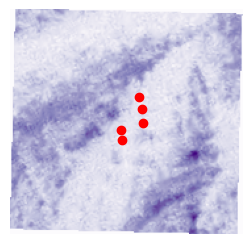

--------------------------------------------------------------------------------
left edge coord:	415257.0	
bottom edge coord:	3907341.0	
right edge coord:	415833.0	
top edge coord:	3907851.0	
dataset width:	192	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32643	
data transform
	| 3.00, 0.00, 415257.00|
| 0.00,-3.00, 3907851.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_171799 ../data/tallo/planetscope/sat_data/fba3f974-2351-49f5-af38-c2fff637a446/PSScene/20230622_045440_85_24cf_3B_AnalyticMS_SR_8b_clip.tif Quercus ilex
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


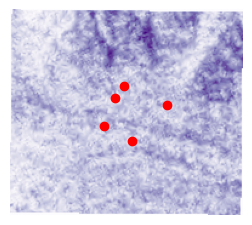

--------------------------------------------------------------------------------
left edge coord:	407373.0	
bottom edge coord:	3944910.0	
right edge coord:	407946.0	
top edge coord:	3945420.0	
dataset width:	191	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32643	
data transform
	| 3.00, 0.00, 407373.00|
| 0.00,-3.00, 3945420.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_167649 ../data/tallo/planetscope/sat_data/24a8ff65-f5da-466c-b310-8aa075b9bfa7/PSScene/20230620_043335_33_2445_3B_AnalyticMS_SR_8b_clip.tif Quercus ilex
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


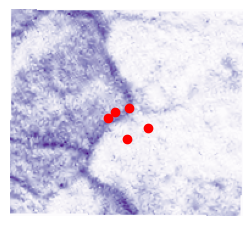

--------------------------------------------------------------------------------
left edge coord:	272778.0	
bottom edge coord:	4662708.0	
right edge coord:	273315.0	
top edge coord:	4663230.0	
dataset width:	179	
dataset height:	174	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 272778.00|
| 0.00,-3.00, 4663230.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_234225 ../data/tallo/planetscope/sat_data/eb682f0f-3ac9-4cf5-b760-25a86e0dbce6/PSScene/20220711_095053_55_2465_3B_AnalyticMS_SR_8b_clip.tif Quercus ilex
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


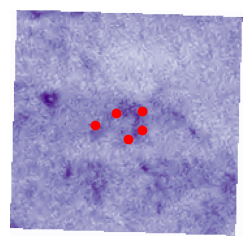

--------------------------------------------------------------------------------
left edge coord:	354759.0	
bottom edge coord:	4599795.0	
right edge coord:	355293.0	
top edge coord:	4600308.0	
dataset width:	178	
dataset height:	171	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 354759.00|
| 0.00,-3.00, 4600308.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_222333 ../data/tallo/planetscope/sat_data/de00878c-6f22-4d29-9ce4-fb4cd0d3e3c5/PSScene/20220615_094555_59_2428_3B_AnalyticMS_SR_8b_clip.tif Quercus petraea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


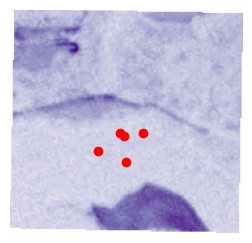

--------------------------------------------------------------------------------
left edge coord:	384783.0	
bottom edge coord:	4670778.0	
right edge coord:	385311.0	
top edge coord:	4671288.0	
dataset width:	176	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 384783.00|
| 0.00,-3.00, 4671288.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_287351 ../data/tallo/planetscope/sat_data/e78d52e2-8f1d-4f0a-9e62-44b622af5e8c/PSScene/20230625_094229_51_2451_3B_AnalyticMS_SR_8b_clip.tif Quercus petraea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


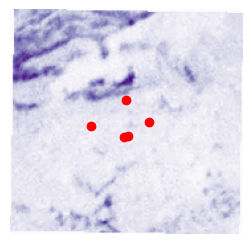

--------------------------------------------------------------------------------
left edge coord:	405774.0	
bottom edge coord:	4683792.0	
right edge coord:	406299.0	
top edge coord:	4684302.0	
dataset width:	175	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 405774.00|
| 0.00,-3.00, 4684302.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_267784 ../data/tallo/planetscope/sat_data/fe1db68e-ff6b-482f-9bcf-f1a671a64948/PSScene/20230625_094227_36_2451_3B_AnalyticMS_SR_8b_clip.tif Quercus petraea
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


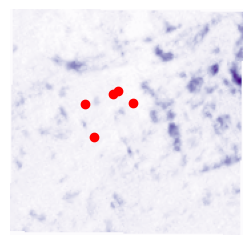

--------------------------------------------------------------------------------
left edge coord:	473487.0	
bottom edge coord:	5909358.0	
right edge coord:	473907.0	
top edge coord:	5909865.0	
dataset width:	140	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32633	
data transform
	| 3.00, 0.00, 473487.00|
| 0.00,-3.00, 5909865.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_114789 ../data/tallo/planetscope/sat_data/9eafc70a-34f1-4016-9fb4-8aebce16e528/PSScene/20230609_090751_75_241e_3B_AnalyticMS_SR_8b_clip.tif Quercus robur
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


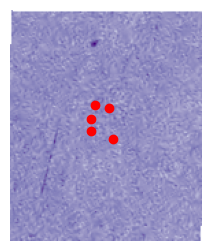

--------------------------------------------------------------------------------
left edge coord:	372918.0	
bottom edge coord:	6133077.0	
right edge coord:	373332.0	
top edge coord:	6133593.0	
dataset width:	138	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32637	
data transform
	| 3.00, 0.00, 372918.00|
| 0.00,-3.00, 6133593.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_342238 ../data/tallo/planetscope/sat_data/7b7c4988-54c9-4086-9a3d-dba5c3b45dfd/PSScene/20220624_074058_26_2421_3B_AnalyticMS_SR_8b_clip.tif Quercus robur
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


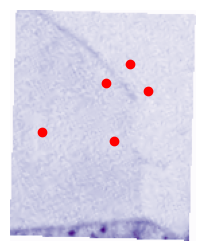

In [13]:
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt

plt.rcParams['svg.fonttype'] = 'none'
t_ids = df['tree_id'].values
fig_dir = f'{data_dir}fig/'
n = 3

for i, img_path in enumerate(df['path'].values):
    if img_path != None:
        o = Image()
        o.load_image(image_path=img_path)
        print(t_ids[i], img_path, df['species'].values[i])
        c = Coords(f'{data_dir}coords/{t_ids[i]}.csv', x_col='lat', y_col='lon', label_col='id',
               id_col='tree_id', sep=',', class1=s, class2=s, crs="EPSG:4326")
        c.transform_coords(tree_coords="EPSG:4326", image_coords=str(o.image.crs), plot=False)
        c.plot_on_image(o)
        plt.show()

--------------------------------------------------------------------------------
left edge coord:	483501.0	
bottom edge coord:	5096040.0	
right edge coord:	483990.0	
top edge coord:	5096544.0	
dataset width:	163	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32632	
data transform
	| 3.00, 0.00, 483501.00|
| 0.00,-3.00, 5096544.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_496860 ../data/tallo/planetscope/sat_data/205329a8-65d5-493a-b55f-1b905b217aaa/PSScene/20220715_092201_89_2430_3B_AnalyticMS_SR_8b_clip.tif Castanea sativa
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------
-----------------------------------------------------------------------

--------------------------------------------------------------------------------
left edge coord:	469008.0	
bottom edge coord:	5138316.0	
right edge coord:	469494.0	
top edge coord:	5138823.0	
dataset width:	162	
dataset height:	169	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32636	
data transform
	| 3.00, 0.00, 469008.00|
| 0.00,-3.00, 5138823.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_342146 ../data/tallo/planetscope/sat_data/f1d22bfa-873b-4e43-9a4b-e885cbfb94e7/PSScene/20220619_074626_82_2430_3B_AnalyticMS_SR_8b_clip.tif Pinus nigra
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------
---------------------------------------------------------------------------

--------------------------------------------------------------------------------
left edge coord:	372918.0	
bottom edge coord:	6133077.0	
right edge coord:	373332.0	
top edge coord:	6133593.0	
dataset width:	138	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32637	
data transform
	| 3.00, 0.00, 372918.00|
| 0.00,-3.00, 6133593.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_342238 ../data/tallo/planetscope/sat_data/7b7c4988-54c9-4086-9a3d-dba5c3b45dfd/PSScene/20220624_074058_26_2421_3B_AnalyticMS_SR_8b_clip.tif Quercus robur
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


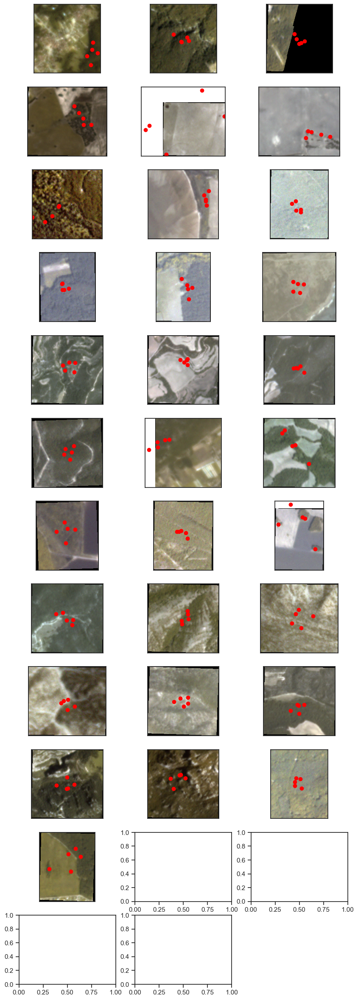

In [14]:
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt

plt.rcParams['svg.fonttype'] = 'none'
t_ids = df['tree_id'].values
fig_dir = f'{data_dir}fig/'
n = 3
fig, axs = plt.subplots(len(set(df['species'].values))-1, n, figsize=(10, 30), facecolor='w', edgecolor='w')

axs = axs.ravel()
axi = 0

for i, img_path in enumerate(df['path'].values):
    if img_path != None:
        o = Image()
        o.load_image(image_path=img_path)
        print(t_ids[i], img_path, df['species'].values[i])
        c = Coords(f'{data_dir}coords/{t_ids[i]}.csv', x_col='lat', y_col='lon', label_col='id',
               id_col='tree_id', sep=',', class1=s, class2=s, crs="EPSG:4326")
        c.transform_coords(tree_coords="EPSG:4326", image_coords=str(o.image.crs), plot=False)
        ax = o.plot_rbg(axs[axi])
        c.plot_on_ax(ax, o)
        ax.set_yticks([])
        ax.set_xticks([])
        axi += 1
plt.axis('off')
plt.gca().axes.get_yaxis().set_visible(False)
plt.gca().axes.get_xaxis().set_visible(False)

plt.savefig(f'{fig_dir}Figure2_planetscope_annotation.svg')
plt.show()


# Now for each species we want to get what its bands filter is

1. Calculate the filter for each of the species then we can also just plot the average differences 


--------------------------------------------------------------------------------
left edge coord:	372918.0	
bottom edge coord:	6133077.0	
right edge coord:	373332.0	
top edge coord:	6133593.0	
dataset width:	138	
dataset height:	172	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32637	
data transform
	| 3.00, 0.00, 372918.00|
| 0.00,-3.00, 6133593.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


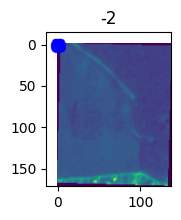

In [150]:
plt.figure(figsize=(20, 2))
n = 2
o = Image()
o.load_image(image_path=img_path)
c = Coords(f'{data_dir}coords/{t_ids[i]}.csv', x_col='lat', y_col='lon', label_col='id',
       id_col='tree_id', sep=',', class1=s, class2=s, crs="EPSG:4326")
c.transform_coords(tree_coords="EPSG:4326", image_coords=str(o.image.crs), plot=False)

df = pd.read_csv(f'{data_dir}coords/{t_ids[i]}.csv')
x = df[c.x_col].values[0]
y = df[c.y_col].values[0]
bb0 = c.build_polygon_from_centre_point(x, y, 1, 1, str(o.image.crs))
bb = [o.image.index(x[0], x[1]) for x in bb0]
plt.imshow(o.image.read(2))
x = df[c.x_col].values[0]
y = df[c.y_col].values[0]
y, x = o.image.index(x, y)
bb = c.build_circle_from_centre_point(x, y, 8)
for b in bb:
    plt.scatter(b[0]-x0, b[1]-y0, s=2, c='blue', alpha=0.5)
plt.title(f'{len(df) - offset - axi}')
axi += 1

In [ ]:
# Test the classification acc on these points but need to first update so that trees can be individa

--------------------------------------------------------------------------------
left edge coord:	405774.0	
bottom edge coord:	4683792.0	
right edge coord:	406299.0	
top edge coord:	4684302.0	
dataset width:	175	
dataset height:	170	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32631	
data transform
	| 3.00, 0.00, 405774.00|
| 0.00,-3.00, 4684302.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
T_342238 ../data/tallo/planetscope/sat_data/fe1db68e-ff6b-482f-9bcf-f1a671a64948/PSScene/20230625_094227_36_2451_3B_AnalyticMS_SR_8b_clip.tif Quercus robur
--------------------------------------------------------------------------------
Removed rows not in class1 or class2 i.e.	Quercus robur	Quercus robur	 in column:	id	Your dataset origionally had:	5	
Now you have:	5	
--------------------------------------------------------------------------------


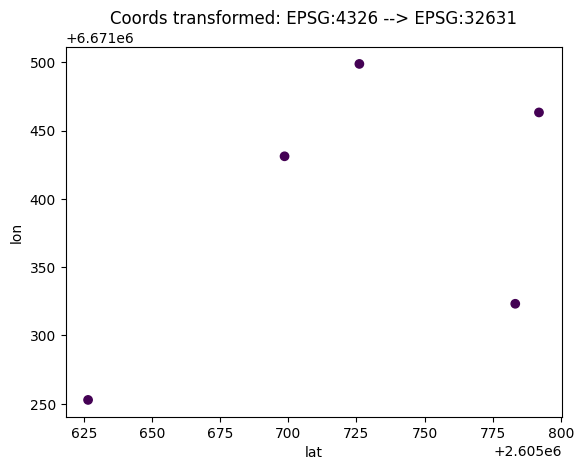

<Axes: >

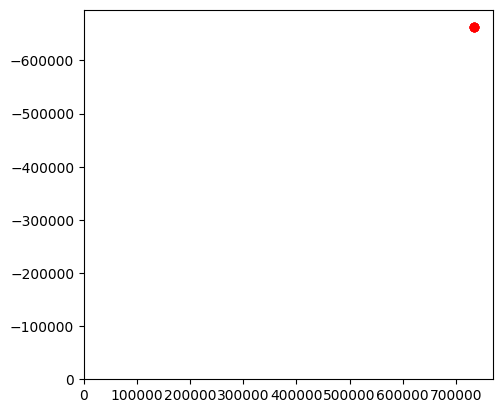

In [167]:
o = Image()
o.load_image(image_path=img_path)
print(t_ids[i], img_path, df['species'].values[i])
c = Coords(f'{data_dir}coords/{t_ids[i]}.csv', x_col='lat', y_col='lon', label_col='id',
       id_col='tree_id', sep=',', class1=s, class2=s, crs="EPSG:4326")
c.transform_coords(tree_coords="EPSG:4326", image_coords=str(o.image.crs), plot=True)
c.plot_on_image(o)

In [168]:
print(o.image.crs)

EPSG:32631


KeyError: 'path'

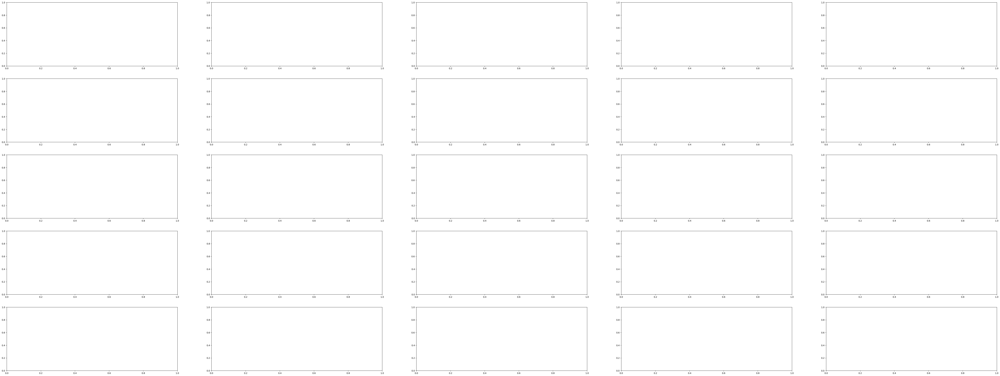

In [169]:
from remseno.indices import *
sub_df = df.head(20)
n = 5
fig, axs = plt.subplots(n,n, figsize=(80, 30), facecolor='w', edgecolor='w')

labels = sub_df['species'].values
axs = axs.ravel()
axi = 0
for img_path in sub_df['path'].values:
    if img_path != None:
        try:
            o = Image()
            o.load_image(image_path=img_path)
            o.name=labels[axi]
            ndvi = get_ndvi(image=o.image, red_band=6, nir_band=8)
            mask = o.mask_on_index(ndvi, 0.75)
            axs[axi].imshow(mask*ndvi)
            axi += 1
        except:
            break
plt.savefig(f'{fig_dir}Figure2_planetscope_NDVI_mask.svg')
plt.show()


In [64]:
from remseno.indices import *
sub_df = df.head(50)
n = 5
fig, axs = plt.subplots(n,n, figsize=(30, 30), facecolor='w', edgecolor='w')

labels = sub_df['species'].values
axs = axs.ravel()
axi = 0
for img_path in sub_df['path'].values:
    if img_path != None:
        try:
            o = Image()
            o.load_image(image_path=img_path)
            o.name=labels[axi]
            ndvi = get_ndvi(image=o.image, red_band=6, nir_band=8)
            mask = o.mask_on_index(ndvi, 0.5)
            axs[axi].imshow(mask*ndvi)
            axi += 1
        except:
            break
plt.savefig(f'{fig_dir}Figure2_planetscope_NDVI_mask.svg')
plt.show()


--------------------------------------------------------------------------------
left edge coord:	479958.0	
bottom edge coord:	5242659.0	
right edge coord:	480471.0	
top edge coord:	5243163.0	
dataset width:	171	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 479958.00|
| 0.00,-3.00, 5243163.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
left edge coord:	548805.0	
bottom edge coord:	5260968.0	
right edge coord:	549321.0	
top edge coord:	5261472.0	
dataset width:	172	
dataset height:	168	
number of bands:	(1, 2, 3, 4, 5, 6, 7, 8)	
geo ref system:	EPSG:32755	
data transform
	| 3.00, 0.00, 548805.00|
| 0.00,-3.00, 5261472.00|
| 0.00, 0.00, 1.00|	
--------------------------------------------------------------------------------
----------------------------------------------------

In [60]:
# Now try and build a classifier/dataset from the images. Randomly sample from the highest NDVI 

array(['Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus camaldulensis', 'Eucalyptus globulus',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus camaldulensis', 'Eucalyptus camaldulensis',
       'Eucalyptus globulus', 'Eucalyptus camaldulensis',
       'Eucalyptus globulus', 'Eucalyptus camaldulensis',
       'Eucalyptus globulus', 'Eucalyptus camaldulensis',
       'Eucalyptus camaldulensis', 'Eucalyptus camaldulensis',
       'Eucalyptus camaldulensis', 'Eucalyptus globulus',
       'Eucalyptus camaldulensis', 'Eucalyptus camaldulensis',
       'Eucalyptus camaldulensis', 'Eucalyptus camaldulensis',
       'Eucalyptus camaldulensis', 'Eucalyptus camaldulensis',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus globulus', 'Eucalyptus globulus',
       'Eucalyptus globu

In [41]:
# Create training data from a list of images linked to a list of coords 